# PokemanIA- Vision Model
This notebook trains a semantic segmentation model using images from the Pokémon video game, labeled via Roboflow.

The goal is to enable the model to identify and classify different regions within each image (e.g., walkable paths, obstacles, characters) by performing pixel-wise segmentation.

This vision system is part of the PokemanIA project, which aims to provide game-playing AI agents with a structured perception of their environment. Semantic segmentation enables the creation of a simplified, information-rich map that can support tasks such as navigation, planning, and reinforcement learning.

### Notebook contents:
- Dataset loading and preprocessing
- Training and evaluation
- Result visualization
- Saving the trained model

## Libraries

In [1]:
from utils.train_evaluate.trainEvaluate import STELLE_Trainer as ST

import torch
from torch.utils.data import Dataset
from torchvision import transforms

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import math
import yaml
import cv2

## Control Variables

In [2]:
PRINT = True
SAVE = True
TRAIN = True
EVAL = True
EXPORT = True

In [3]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 256
DATASET_PATCH = "dataset/data.yaml"

N_EPOCHS = 10
ITERATIONS = 1

## Dataset

In [4]:
class STELLE_Data(Dataset):
    def __init__(self, yaml_path, split='train',img_size=(144, 160)):
        with open(yaml_path, 'r') as f:
            data = yaml.safe_load(f)

        assert split in ['train', 'val', 'test'], "Split debe ser 'train', 'val' o 'test'"

        self.image_dir = data[split]
        self.label_dir = self.image_dir.replace('/images', '/labels')
        self.img_size = img_size
        self.num_classes = data['nc']
        self.class_names = data['names']

        self.image_files = [f for f in os.listdir(self.image_dir) if f.endswith(('.jpg', '.png'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_file = self.image_files[idx]
        image_path = os.path.join(self.image_dir, img_file)
        label_path = os.path.join(self.label_dir, os.path.splitext(img_file)[0] + ".txt")

        image = Image.open(image_path).convert("L")
        image = image.resize((self.img_size[1], self.img_size[0]))
        image_tensor = transforms.ToTensor()(image)

        h, w = self.img_size
        mask = np.zeros(self.img_size, dtype=np.uint8)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) < 7:
                        continue
    
                    # El primer token es el ID de clase
                    class_id = int(parts[0])
                    coords = list(map(float, parts[1:]))
                    if len(coords) % 2 != 0:
                        continue
    
                    pts = np.array(coords, dtype=np.float32).reshape(-1, 2)

                    pts[:, 0] *= w  # x: ancho
                    pts[:, 1] *= h  # y: alto
                    pts = pts.astype(np.int32)

                    pts[:, 0] = np.clip(pts[:, 0], 0, w - 1)
                    pts[:, 1] = np.clip(pts[:, 1], 0, h - 1)
    
                    cv2.fillPoly(mask, [pts], color=class_id+1)
    
        mask_tensor = torch.from_numpy(mask).long()
        return image_tensor, mask_tensor

In [5]:
dataset =STELLE_Data(DATASET_PATCH)
model = ST(dataset,batch_size= BATCH_SIZE)

In [6]:
if PRINT:
    img, mask= next(iter(model.dataloader))
    print(f"Shape image: {img.shape}, Type image: {type(img)}, Dtype image: {img.dtype}")
    print(f"Shape mask: {mask.shape}, Type mask: {type(mask)}, Dtype mask: {mask.dtype}")

Shape image: torch.Size([256, 1, 144, 160]), Type image: <class 'torch.Tensor'>, Dtype image: torch.float32
Shape mask: torch.Size([256, 144, 160]), Type mask: <class 'torch.Tensor'>, Dtype mask: torch.int64


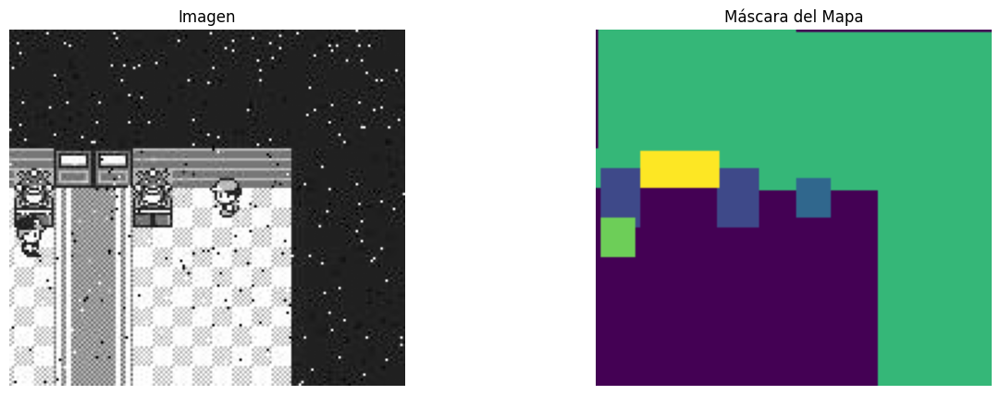

In [7]:
img, mask= next(iter(model.dataloader))
img = img[0].permute(1, 2, 0).numpy()

mask = mask[0].numpy()

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].imshow(img, cmap="gray")
ax[0].set_title("Imagen")
ax[0].axis("off")


ax[1].imshow(mask)
ax[1].set_title("Máscara del Mapa")
ax[1].axis("off")

plt.show()

## Training

In [8]:
if TRAIN:
    for i in range(ITERATIONS):
        model.train(N_EPOCHS,1000)

Epocas 10: 100%|███████████████████████████████████████████████████████████████████████| 10/10 [01:57<00:00, 11.75s/it]


## Evaluation

In [9]:
if EVAL:
    dataset =STELLE_Data(DATASET_PATCH, split = 'test')
    model.evaluate(dataset = dataset)

100%|████████████████████████████████████████████████████████████████████████████████| 132/132 [00:02<00:00, 60.16it/s]


Mean (Unweighted) Metrics:
  Pixel Accuracy: 0.9544
  Mean IoU: 0.8974
  Mean Precision: 0.3429
  Mean Recall: 0.3344
  Mean F1 Score: 0.3338

Weighted Metrics:
  Precision: 0.7383
  Recall: 0.7440
  F1 Score: 0.7391

Time Metrics:
  Average Time per Image: 0.0012 seconds
  Frames Per Second (FPS): 852.34


## Visual Examples

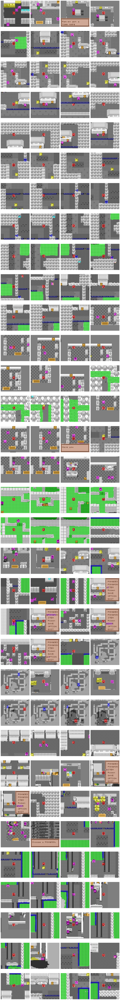

In [10]:
class_names = ['background', 'capture', 'read', 'main', 'map', 'mo', 'non_walkable', 'npc', 'poke_ball', 'door', 'recover', 'jump', 'selected', 'text']
color_dict = {
    'background':     (0, 0, 0),
    'capture':        (0, 255, 0),
    'read':           (255, 255, 0),
    'main':           (255, 0, 0),
    'map':            (125, 125, 125),
    'mo':             (0, 0, 255),
    'non_walkable':   (255, 255, 255),
    'npc':            (255, 0, 255),
    'poke_ball':      (0, 255, 255),
    'door':           (255, 165, 0),
    'recover':        (0, 128, 0),
    'jump':           (0, 0, 128),
    'selected':       (139, 0, 139),
    'text':           (160, 82, 45),
}
colors = np.array([color_dict[name] for name in class_names]) / 255.0

image_paths = sorted(glob.glob("./dataset/test/images/*.[jp][pn]*g"))

cols = 4
rows = math.ceil(len(image_paths) / cols)

fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i >= len(image_paths):
        ax.axis('off')
        continue

    path = image_paths[i]
    img = Image.open(path).convert('L')
    img_array = np.array(img)[..., np.newaxis]

    with torch.no_grad():
        prediction = model.predict(img_array)

        mask_rgb = np.zeros((*prediction.shape, 3), dtype=np.float32)
        for class_id, color in enumerate(colors):
            if class_id == 0:
                continue
            mask_rgb[prediction == class_id] = color

        img_rgb = np.stack([np.array(img)/255.0]*3, axis=-1)
        alpha = 0.5
        overlay = (1 - alpha) * img_rgb + alpha * mask_rgb

        ax.imshow(overlay)
        ax.axis('off')

plt.tight_layout()
plt.show()

## Save model

In [ ]:
if SAVE:
    model_dir = "models_imp"
    os.makedirs(model_dir, exist_ok=True)
    permanent_model_path = os.path.join(model_dir, f"{model.model.__class__.__name__}.pth")
    torch.save(model.model.state_dict(), permanent_model_path)
    
    print(f"Model saved into: {permanent_model_path}")

Model saved into: models_STELLE_imp\STELLE_Seg.pth


## Export onnx

In [12]:
if EXPORT:
    model.model.eval()
    model.model.to("cpu")
    
    example_input = (torch.randn(1, 1, 144, 160),)
    
    torch.onnx.export(
        model.model,
        example_input,
        "Stelle_Seg.onnx",
        export_params=True,
        opset_version=12,  
        do_constant_folding=True,
        input_names=["input"],
        output_names=["output"],
        dynamic_axes={
            "input": {0: "batch_size"},
            "output": {0: "batch_size"},
        }
    )
    print("✅ ONNX export successfully completed")

✅ ONNX export successfully completed
